$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip exists, skipping download.
Extracting C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip...
Extracted 532 to C:\Users\kingh\.pytorch-datasets\George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


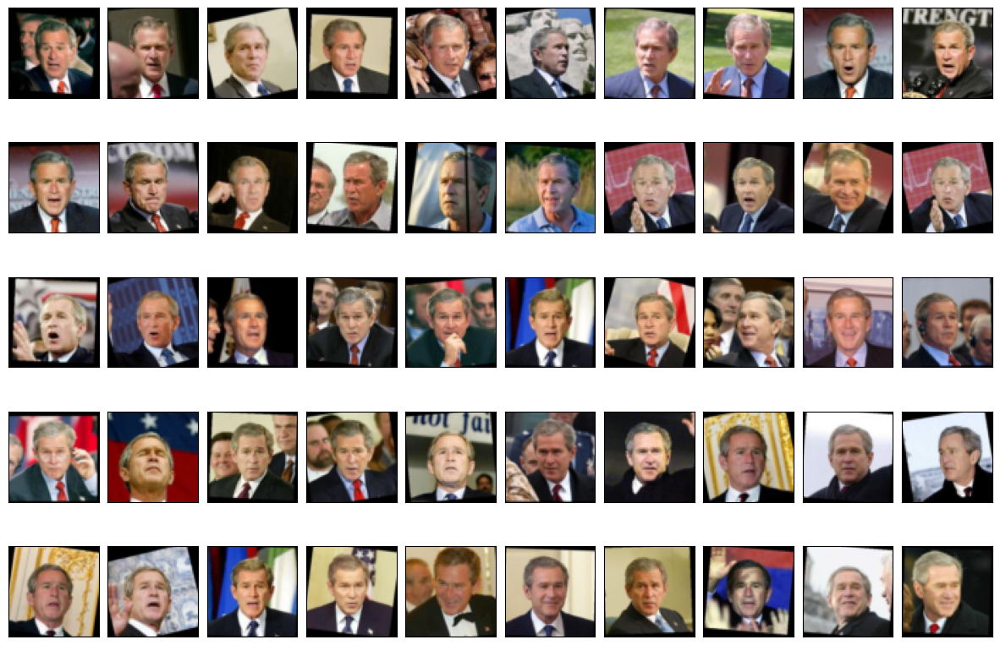

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
  )
  (fully_connected_layer): Linear(in_features=16384, out_features=1, bias=True)
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=16384, bias=False)
  (generator): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(512, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

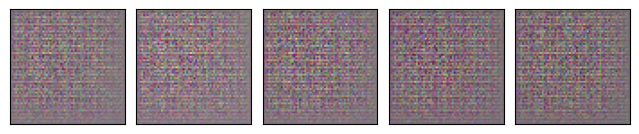

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 8, 'z_dim': 1024, 'data_label': 1, 'label_noise': 0.2, 'learn_rate': 0.0002, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002}}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:05<00:00, 11.37it/s]
Discriminator loss: 0.19003908636409844
Generator loss:     5.3351591220542565
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


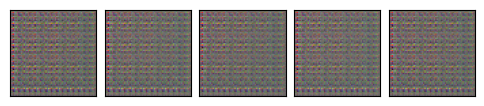

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.47it/s]
Discriminator loss: 0.054213681883776364
Generator loss:     7.024961226022065
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


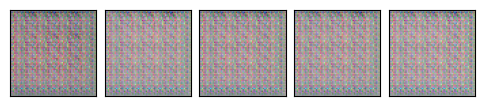

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.34it/s]
Discriminator loss: 0.06842832820517804
Generator loss:     7.796007305828493
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


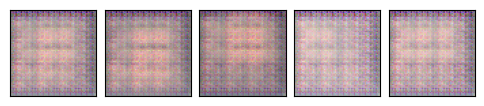

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.25it/s]
Discriminator loss: 0.05303908684360447
Generator loss:     7.312902671187671
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


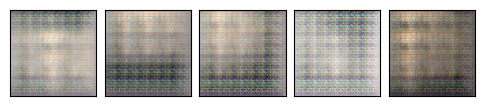

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.58it/s]
Discriminator loss: 0.11802687418104997
Generator loss:     7.404937797517919
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


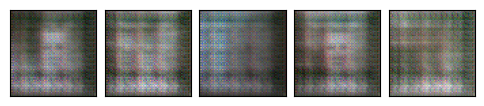

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.44it/s]
Discriminator loss: 0.07449000884792698
Generator loss:     7.605910934619049
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


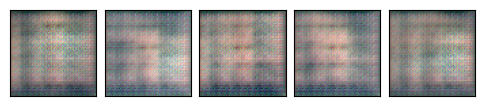

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.47it/s]
Discriminator loss: 0.08870838688158278
Generator loss:     7.251223941347492
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


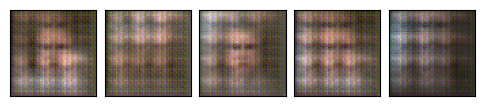

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.43it/s]
Discriminator loss: 0.15631770147983706
Generator loss:     8.037939409711468
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


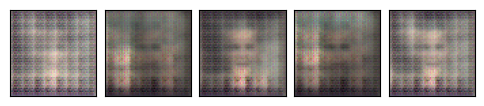

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.45it/s]
Discriminator loss: 0.13807739136712766
Generator loss:     6.947078626547286
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


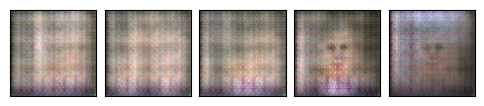

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.42it/s]
Discriminator loss: 0.10783914932564123
Generator loss:     7.52185300926664
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


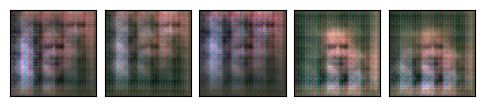

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.27it/s]
Discriminator loss: 0.08087339107670001
Generator loss:     6.815169608415062
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


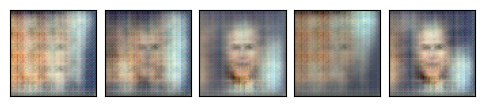

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.42it/s]
Discriminator loss: 0.17057142690268914
Generator loss:     7.297281841733563
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


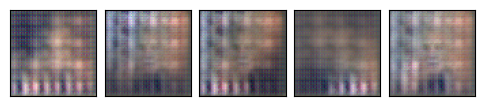

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.26it/s]
Discriminator loss: 0.09486584888020558
Generator loss:     8.71217355087622
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


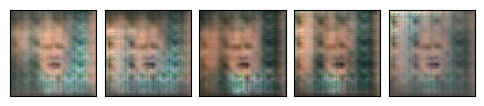

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.46it/s]
Discriminator loss: 0.1392451553647198
Generator loss:     8.709815231721793
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


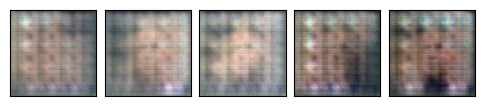

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.40it/s]
Discriminator loss: 0.18442189810213758
Generator loss:     7.187624048830858
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


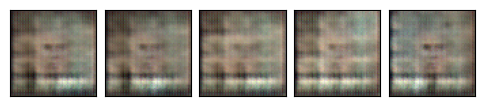

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.39it/s]
Discriminator loss: 0.1822292277617241
Generator loss:     8.972764178888122
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


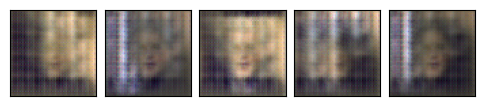

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.41it/s]
Discriminator loss: 0.1277325718260523
Generator loss:     8.02077100526041
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


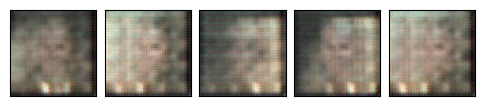

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.34it/s]
Discriminator loss: 0.11548917835105711
Generator loss:     6.930994852265315
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


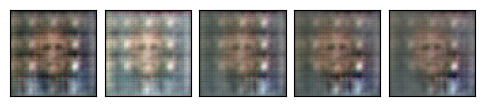

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.05822798832138972
Generator loss:     6.215315018127214
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


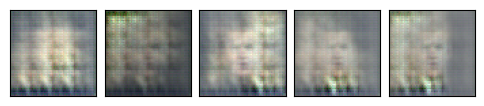

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.1587147885627711
Generator loss:     7.632319848928878
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


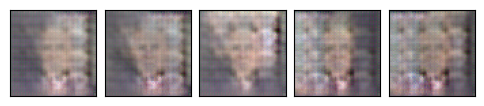

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.32it/s]
Discriminator loss: 0.13665722812345224
Generator loss:     7.302519734226056
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


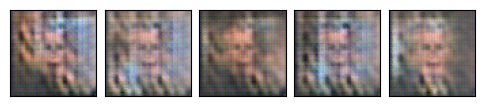

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.30it/s]
Discriminator loss: 0.17112417307807437
Generator loss:     7.289732630573102
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


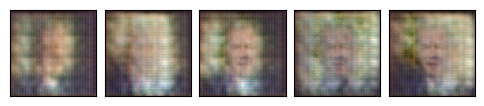

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.08it/s]
Discriminator loss: 0.12962476205803566
Generator loss:     7.02407648314291
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


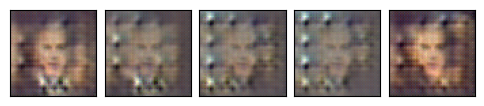

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.18it/s]
Discriminator loss: 0.0957280413539552
Generator loss:     7.122764377451655
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


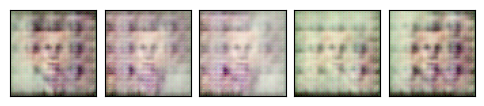

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.36it/s]
Discriminator loss: 0.28009902852684704
Generator loss:     8.521358404586564
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


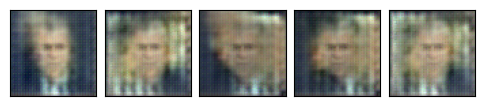

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.29it/s]
Discriminator loss: 0.19566948928717356
Generator loss:     6.829626307558658
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


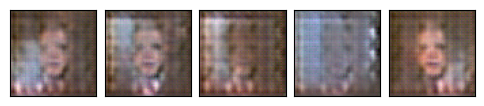

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.23it/s]
Discriminator loss: 0.06190455248996393
Generator loss:     6.278134794377569
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


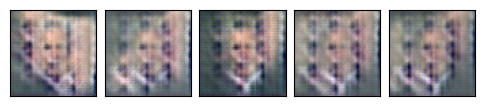

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.36it/s]
Discriminator loss: 0.17159856057989953
Generator loss:     6.7914711041236995
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


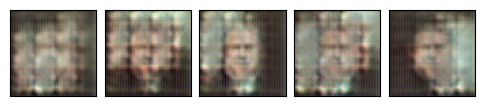

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.40it/s]
Discriminator loss: 0.14724553887968633
Generator loss:     6.076801196852727
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


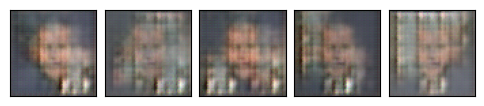

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.36it/s]
Discriminator loss: 0.16446445520911643
Generator loss:     6.945861118942944
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


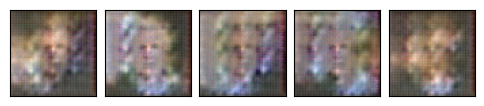

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.28it/s]
Discriminator loss: 0.24657757380115453
Generator loss:     7.42179548206614
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


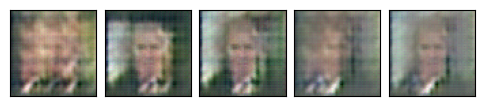

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.11730494216751697
Generator loss:     7.311482116357604
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


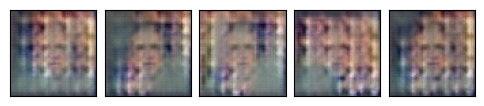

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.40it/s]
Discriminator loss: 0.12486646758086646
Generator loss:     7.736156734068002
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


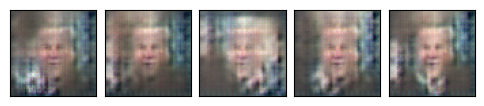

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.40it/s]
Discriminator loss: 0.1048511206102905
Generator loss:     6.985003599480017
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


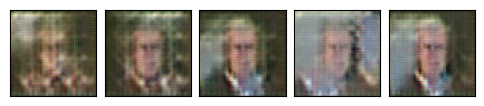

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.32it/s]
Discriminator loss: 0.13198335718975138
Generator loss:     7.017641028361534
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


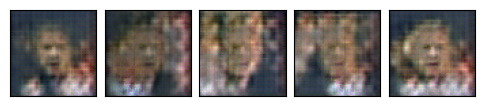

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.20it/s]
Discriminator loss: 0.19608688154327336
Generator loss:     7.346984066180329
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


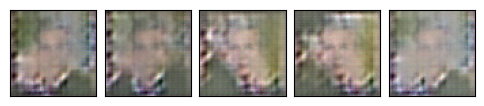

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.36it/s]
Discriminator loss: 0.11793681517688197
Generator loss:     6.804660391451708
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


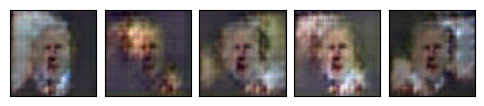

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.18756962473045535
Generator loss:     6.16379745326825
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


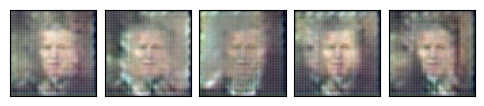

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.37it/s]
Discriminator loss: 0.0832594139362449
Generator loss:     7.156901886214071
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


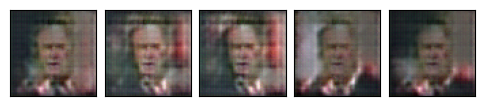

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.27it/s]
Discriminator loss: 0.13935016060887434
Generator loss:     6.545602029828883
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


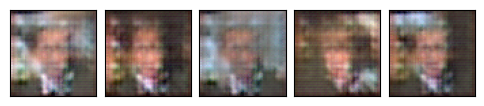

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.31it/s]
Discriminator loss: 0.16343636577253912
Generator loss:     7.215109369648037
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


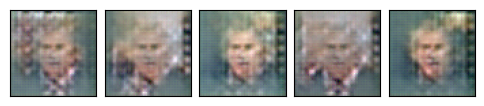

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.25it/s]
Discriminator loss: 0.10924897454122999
Generator loss:     6.3862287927029735
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


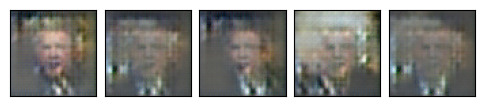

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.09it/s]
Discriminator loss: 0.25355722844155865
Generator loss:     7.043352621704785
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


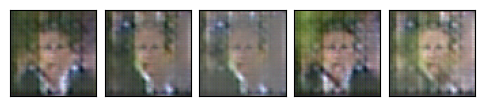

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.31it/s]
Discriminator loss: 0.07554363275864232
Generator loss:     6.371401345551903
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


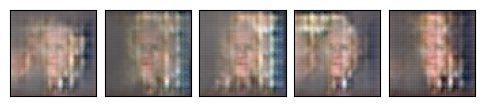

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.24it/s]
Discriminator loss: 0.1759226397791905
Generator loss:     6.3302104010510805
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


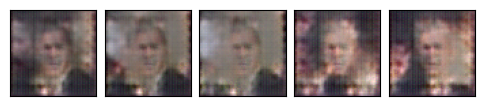

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.11191845568480777
Generator loss:     6.801991213613482
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


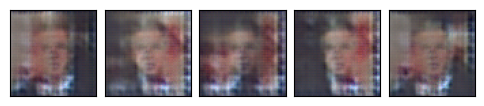

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.34it/s]
Discriminator loss: 0.14183964724860973
Generator loss:     6.414480800059304
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


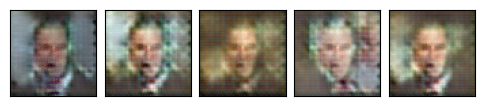

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.26it/s]
Discriminator loss: 0.14979533895627775
Generator loss:     7.0250509888378545
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


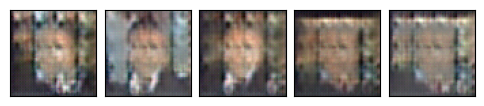

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.73it/s]
Discriminator loss: 0.17471965758213356
Generator loss:     7.600892273347769
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


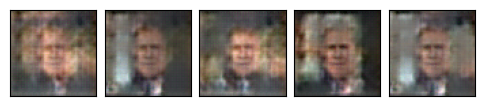

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.34it/s]
Discriminator loss: 0.06760759390334585
Generator loss:     6.573531947918792
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


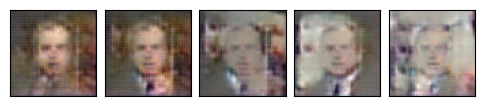

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.06it/s]
Discriminator loss: 0.17200434936293915
Generator loss:     5.9347753453610546
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


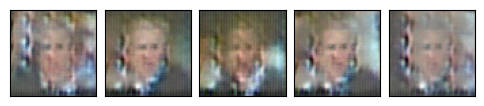

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.34it/s]
Discriminator loss: 0.0726497802160569
Generator loss:     5.916266754492005
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


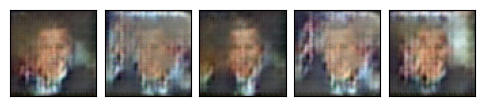

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.42it/s]
Discriminator loss: 0.1106296527519155
Generator loss:     7.878428533895692
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


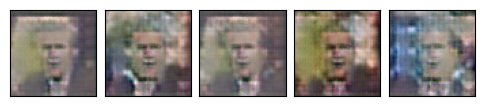

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.42it/s]
Discriminator loss: 0.0955804632559641
Generator loss:     7.015340004394304
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


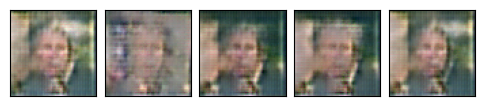

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.44it/s]
Discriminator loss: 0.18371931563562421
Generator loss:     6.707382109627795
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


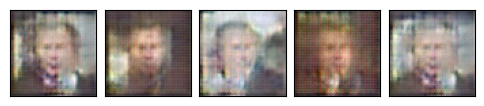

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.44it/s]
Discriminator loss: 0.10105472071958121
Generator loss:     7.0623586676014005
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


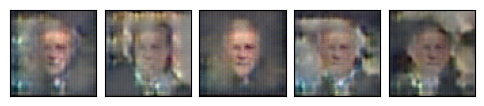

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.35it/s]
Discriminator loss: 0.11204787543905315
Generator loss:     7.22054336675957
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


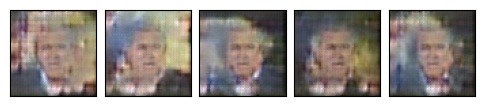

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.41it/s]
Discriminator loss: 0.16548490274085928
Generator loss:     6.265384666955293
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


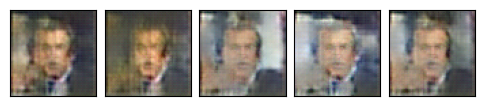

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.39it/s]
Discriminator loss: 0.07461032971962174
Generator loss:     8.058512851373473
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


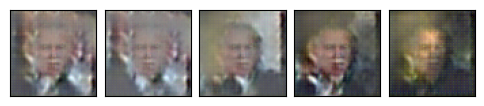

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.37it/s]
Discriminator loss: 0.14606895058679936
Generator loss:     7.118630362980402
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


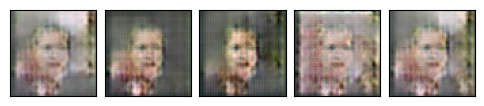

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.40it/s]
Discriminator loss: 0.07121054272153485
Generator loss:     6.260253607337154
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


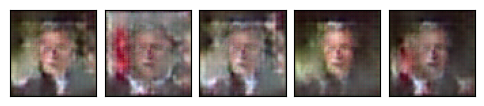

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.38it/s]
Discriminator loss: 0.14837569546010068
Generator loss:     6.760272928138278
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


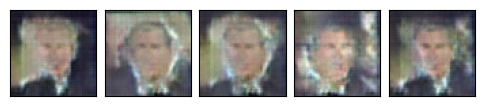

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.42it/s]
Discriminator loss: 0.1513928063491832
Generator loss:     6.626892136104071
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


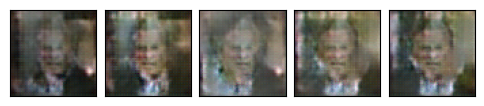

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.36it/s]
Discriminator loss: 0.16571387342775046
Generator loss:     7.190663800310733
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


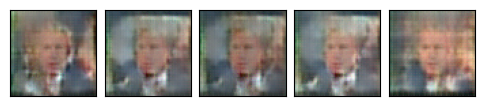

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.37it/s]
Discriminator loss: 0.17097996002924976
Generator loss:     7.362174902389299
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


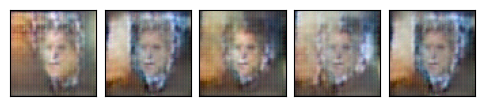

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.26it/s]
Discriminator loss: 0.2693258876453585
Generator loss:     8.069420820741511
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


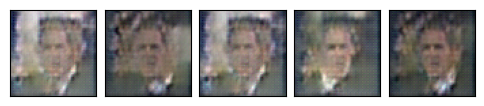

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.97it/s]
Discriminator loss: 0.1380154570536827
Generator loss:     6.381977533226583
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


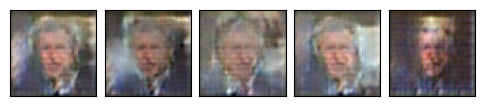

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.30it/s]
Discriminator loss: 0.08940149946555273
Generator loss:     6.433277471741634
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


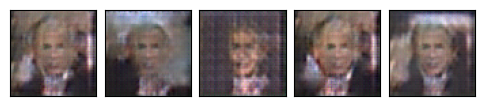

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.33it/s]
Discriminator loss: 0.10531861062592535
Generator loss:     7.140274122579774
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


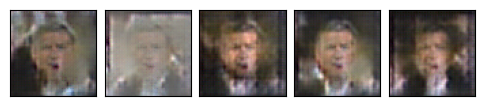

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 14.46it/s]
Discriminator loss: 0.11071618813187328
Generator loss:     7.516685183368512
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


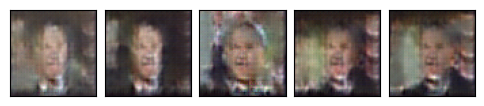

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 15.82it/s]
Discriminator loss: 0.0984225537238726
Generator loss:     6.464299846051344
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


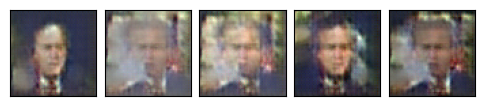

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.83it/s]
Discriminator loss: 0.13678575824223346
Generator loss:     6.178549681136857
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


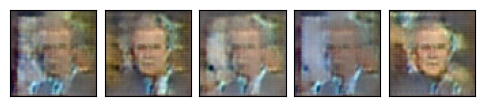

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.76it/s]
Discriminator loss: 0.17244768292823834
Generator loss:     6.7385731099256825
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


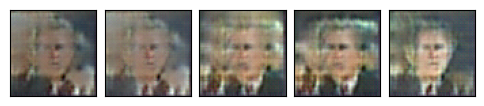

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.86it/s]
Discriminator loss: 0.15862562868799737
Generator loss:     7.200367573481887
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


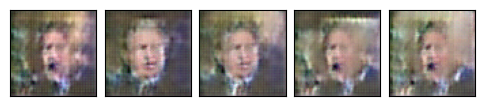

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.65it/s]
Discriminator loss: 0.12610452961343438
Generator loss:     7.698312567241156
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


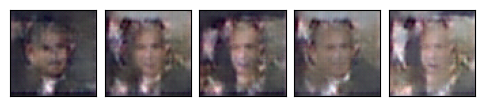

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.02it/s]
Discriminator loss: 0.2574316194531188
Generator loss:     7.594885658861986
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


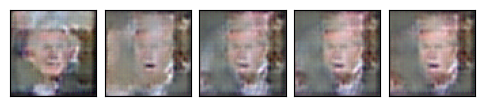

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.68it/s]
Discriminator loss: 0.1068005071702733
Generator loss:     7.2028877486043905
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


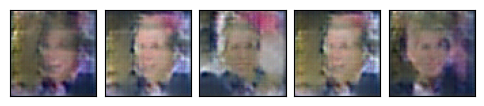

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.96it/s]
Discriminator loss: 0.2707619630356333
Generator loss:     6.451938141637774
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


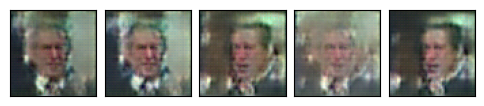

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.39it/s]
Discriminator loss: 0.16219837349186192
Generator loss:     7.49071398066051
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


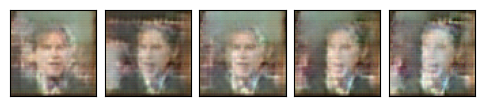

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.76it/s]
Discriminator loss: 0.08269749025800335
Generator loss:     6.6840775653497495
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


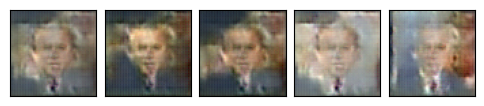

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.00it/s]
Discriminator loss: 0.2162080956483955
Generator loss:     6.878706102940574
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


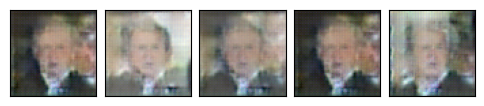

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.70it/s]
Discriminator loss: 0.06505765771465515
Generator loss:     6.198380961346982
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


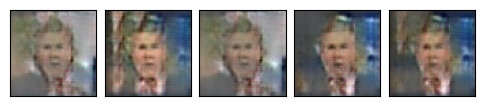

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.90it/s]
Discriminator loss: 0.12436421760427419
Generator loss:     6.824573006202925
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


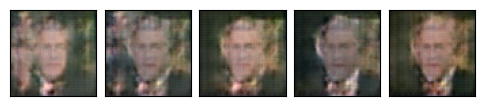

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.98it/s]
Discriminator loss: 0.17288902135037665
Generator loss:     7.4603793941326995
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


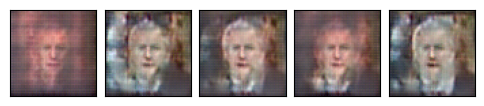

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.88it/s]
Discriminator loss: 0.1685085978859396
Generator loss:     8.217431634219725
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


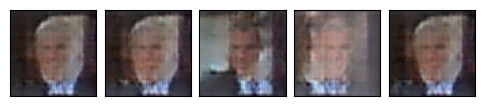

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.59it/s]
Discriminator loss: 0.11154430159437123
Generator loss:     6.766224836235616
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


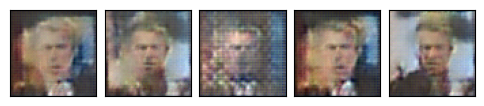

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.05it/s]
Discriminator loss: 0.09260970026032249
Generator loss:     6.466584191393497
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


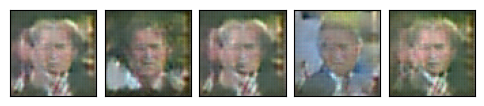

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.91it/s]
Discriminator loss: 0.11066174774027582
Generator loss:     6.498599276613834
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


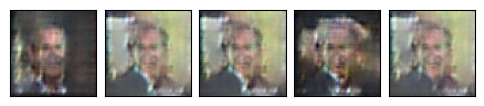

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.30it/s]
Discriminator loss: 0.2882786824632047
Generator loss:     7.729721023075617
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


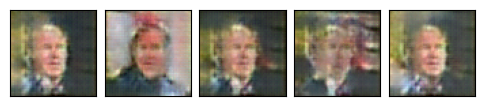

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.92it/s]
Discriminator loss: 0.17818000117567048
Generator loss:     6.884964163623639
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


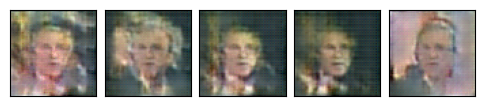

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.81it/s]
Discriminator loss: 0.1265122365039676
Generator loss:     6.086930830087235
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


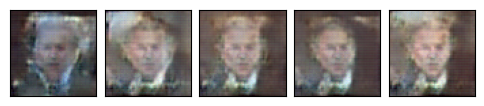

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.96it/s]
Discriminator loss: 0.03960849391991523
Generator loss:     5.843879849163454
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


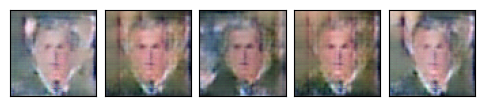

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.56it/s]
Discriminator loss: 0.09986260638975386
Generator loss:     6.5722926054427875
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


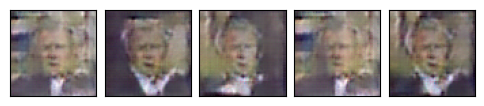

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.01it/s]
Discriminator loss: 0.1425704235461221
Generator loss:     6.629219307828305
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


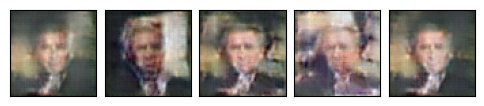

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.41it/s]
Discriminator loss: 0.1308617272706174
Generator loss:     6.444096997602662
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


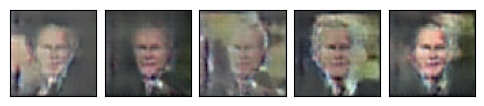

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.89it/s]
Discriminator loss: 0.2072413516467187
Generator loss:     8.83697733950259
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


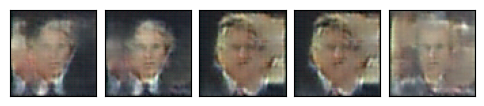

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.85it/s]
Discriminator loss: 0.11744130986617572
Generator loss:     8.05687776252405
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


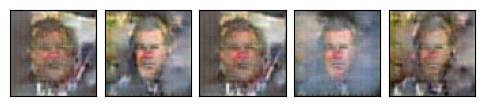

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 16.88it/s]
Discriminator loss: 0.16391008252750583
Generator loss:     6.839140468568944
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


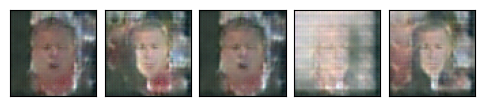

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:04<00:00, 16.15it/s]
Discriminator loss: 0.16335976952269896
Generator loss:     7.669472247806947
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


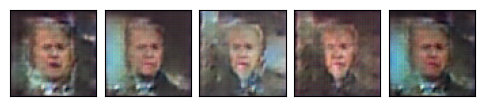

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.05it/s]
Discriminator loss: 0.18083960740868724
Generator loss:     7.527388053153878
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


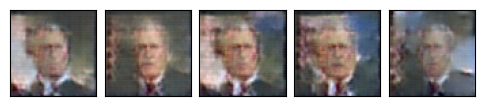

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


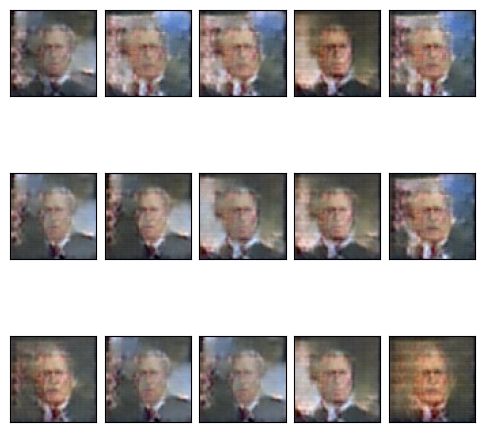

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [18]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [19]:
display_answer(hw3.answers.part3_q1)


**Your answer:**



### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [20]:
display_answer(hw3.answers.part3_q2)


**Your answer:**




### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [21]:
display_answer(hw3.answers.part3_q3)


**Your answer:**



